<a href="https://colab.research.google.com/github/farrelandika/PCVK_Genap_2021/blob/main/Modul_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 1. Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2. Import Library Utama
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import glob
from google.colab.patches import cv2_imshow
import math

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


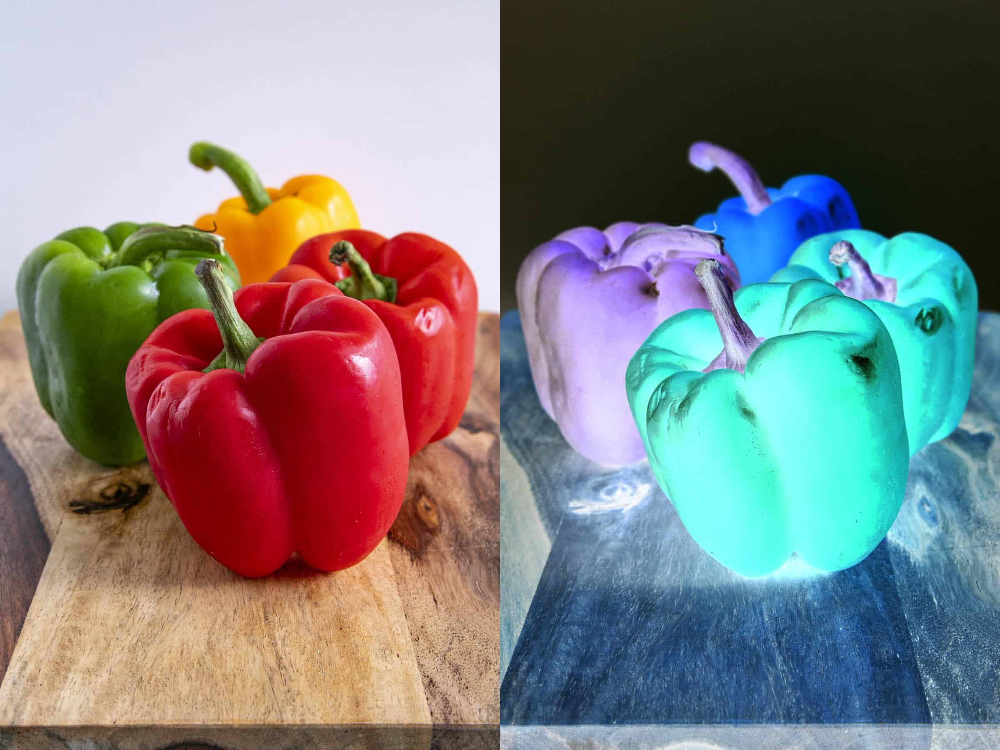

In [32]:
img = cv.imread('/content/drive/MyDrive/PCVK/Bell-Peppers1.jpg')
inverse_img = 255 - img

cv2_imshow(cv.hconcat((img, inverse_img)))

Mengubah kontras dan tingkat kecerahan citra
Masukkan tingkat kecerahan: 30
Masukkan kontras: 1


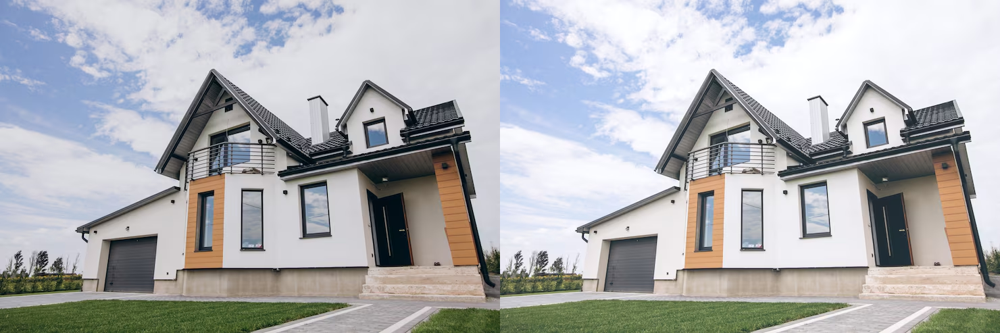

In [31]:
print('Mengubah kontras dan tingkat kecerahan citra')
try:
    brightness = int(input('Masukkan tingkat kecerahan: '))
    contrast = float(input('Masukkan kontras: '))
except ValueError:
    print('Error, not a number')

img = cv.imread('/content/drive/MyDrive/PCVK/house-isolated-field_1303-23773.avif')
contrast_img = np.zeros(img.shape, img.dtype)

# Menghitung contrast & brightness
for y in range(img.shape[0]):
    for x in range(img.shape[1]):
        for c in range(img.shape[2]):
            contrast_img[y, x, c] = np.clip(contrast * img[y, x, c] + brightness, 0, 255)

final = cv.hconcat((img, contrast_img))
cv2_imshow(final)

Mengubah tingkat kecerahan citra dengan Transformasi Log
Masukkan nilai kecerahan / konstanta: 50


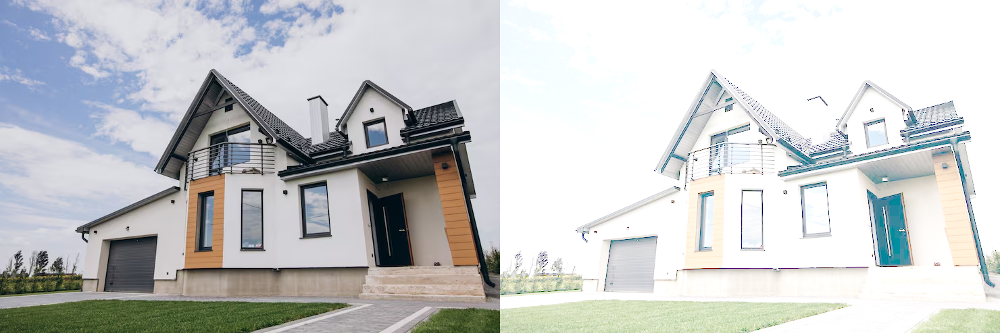

In [33]:
#Transformasi Logarithmic Brightness
print('Mengubah tingkat kecerahan citra dengan Transformasi Log')
try:
    c_val = float(input('Masukkan nilai kecerahan / konstanta: '))
except ValueError:
    print('Error, not a number')

img = cv.imread('/content/drive/MyDrive/PCVK/house-isolated-field_1303-23773.avif')

# Konversi citra ke float untuk perhitungan logaritma
img_float = img.astype(np.float32)

# Rumus Logarithmic Transformation: s = c * log(1 + r)
# Menggunakan log1p (log(1 + x))
c = 255 / np.log(1 + np.max(img_float)) if c_val == 0 else c_val
log_img = c * np.log1p(img_float)
log_img = np.clip(log_img, 0, 255).astype(np.uint8)

final = cv.hconcat((img, log_img))
cv2_imshow(final)

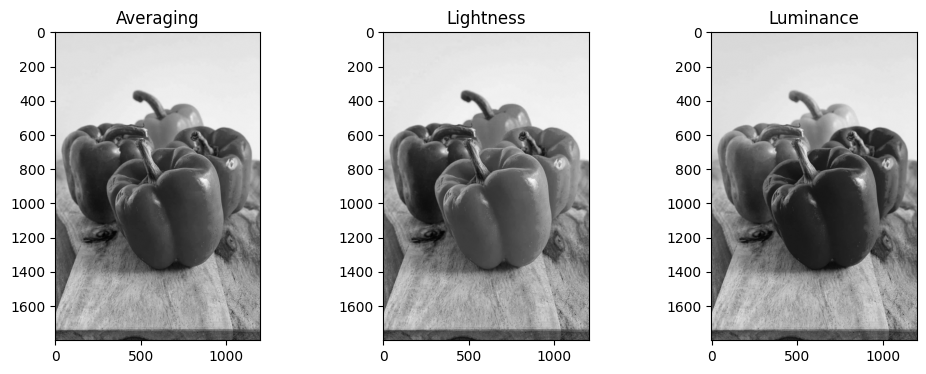

In [35]:
#Transformasi Grayscale (Averaging, Lightness, Luminance)
img_bgr = cv.imread('/content/drive/MyDrive/PCVK/Bell-Peppers1.jpg')
img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

R = img_rgb[:, :, 0].astype(np.float32)
G = img_rgb[:, :, 1].astype(np.float32)
B = img_rgb[:, :, 2].astype(np.float32)

# a. Averaging
gray_avg = ((R + G + B) / 3).astype(np.uint8)

# b. Lightness
gray_lightness = ((np.maximum(np.maximum(R, G), B) + np.minimum(np.minimum(R, G), B)) / 2).astype(np.uint8)

# c. Luminance
gray_luminance = (0.21 * R + 0.72 * G + 0.07 * B).astype(np.uint8)

# Visualisasi
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1); plt.imshow(gray_avg, cmap='gray'); plt.title('Averaging')
plt.subplot(1, 3, 2); plt.imshow(gray_lightness, cmap='gray'); plt.title('Lightness')
plt.subplot(1, 3, 3); plt.imshow(gray_luminance, cmap='gray'); plt.title('Luminance')
plt.show()

Masukkan nilai Gamma: 0.5


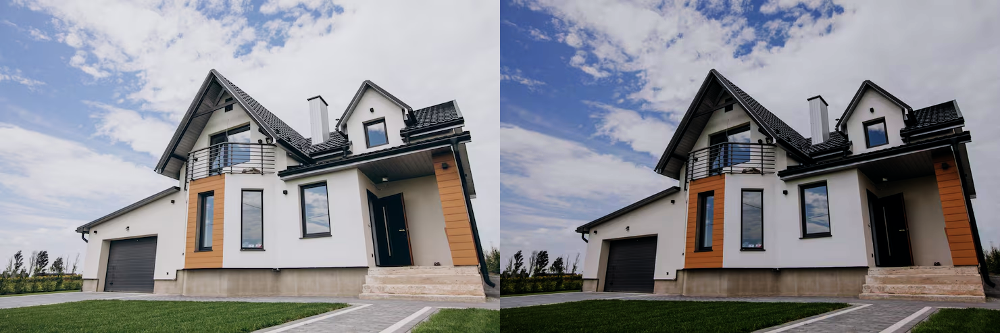

In [37]:
#Gamma Correction
gamma = float(input('Masukkan nilai Gamma: '))
img = cv.imread('/content/drive/MyDrive/PCVK/house-isolated-field_1303-23773.avif')

gamma_corrected = np.array(255 * (img / 255.0) ** (1.0 / gamma), dtype='uint8')

cv2_imshow(cv.hconcat((img, gamma_corrected)))

Masukkan bit depth tujuan (1-8): 3


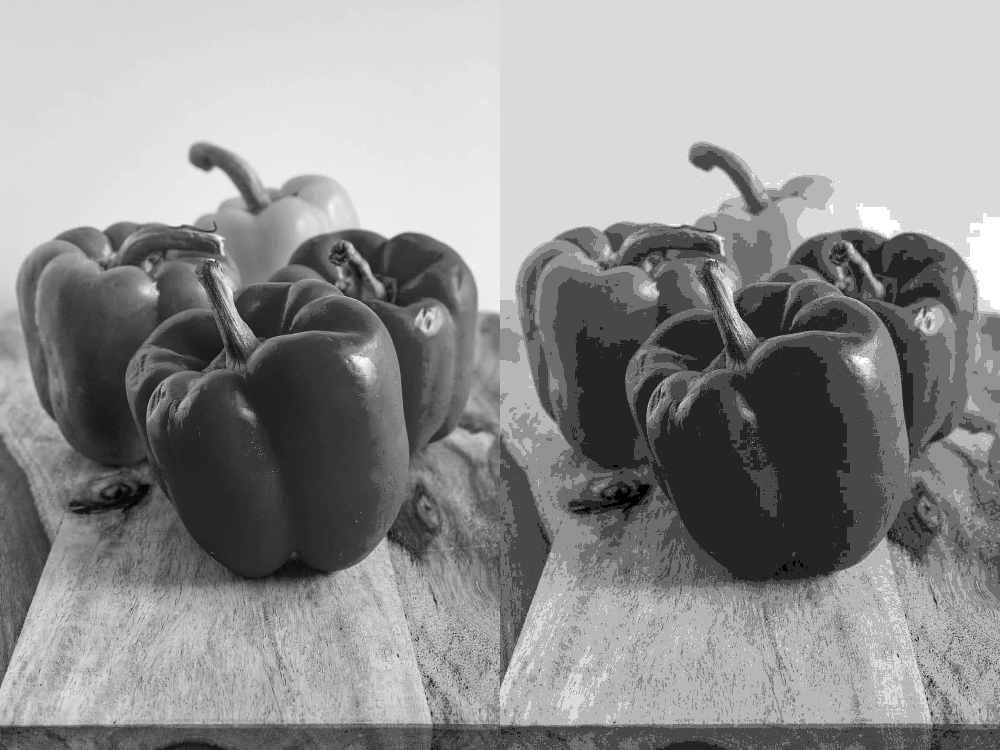

In [43]:
bit_depth = int(input("Masukkan bit depth tujuan (1-8): "))
level = 255.0 / (pow(2, bit_depth) - 1)

original = cv.imread('/content/drive/MyDrive/PCVK/Bell-Peppers1.jpg', cv.IMREAD_GRAYSCALE)
depth_image = np.zeros(original / level) * level
depth_image = np.clip(depth_image, 0, 255).astype(np.uint8)

cv2_imshow(cv.hconcat((original, depth_image)))

N=10, PSNR=29.37 dB
N=20, PSNR=30.80 dB
N=40, PSNR=31.74 dB
N=80, PSNR=32.30 dB
N=100, PSNR=32.42 dB


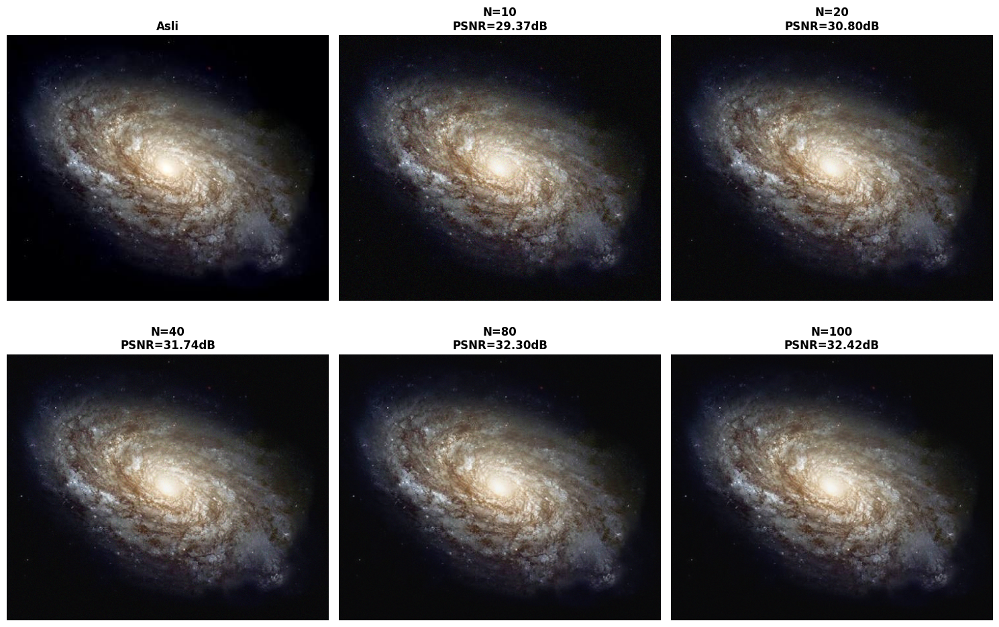

In [49]:
import cv2
# Load gambar
img = cv2.imread('/content/drive/MyDrive/PCVK/images (2).jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Fungsi PSNR
def calculate_psnr(original, noisy):
    mse = np.mean((original.astype(float) - noisy.astype(float)) ** 2)
    return 20 * np.log10(255.0 / np.sqrt(mse)) if mse != 0 else float('inf')

# Parameter
sigma = 25
num_images_list = [10, 20, 40, 80, 100]
results = []
filtered_images = {}

# Proses filtering
for num_images in num_images_list:
    filtered = np.zeros_like(img, dtype=float)
    for _ in range(num_images):
        noise = np.random.normal(0, sigma, img.shape)
        noisy = np.clip(img.astype(float) + noise, 0, 255)
        filtered += noisy / num_images

    filtered = np.clip(filtered, 0, 255).astype(np.uint8)
    filtered_images[num_images] = filtered
    psnr = calculate_psnr(img, filtered)
    results.append({'num': num_images, 'psnr': psnr})
    print(f"N={num_images}, PSNR={psnr:.2f} dB")

# Tampilkan gambar
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

axes[0].imshow(img_rgb)
axes[0].set_title('Asli', fontweight='bold')
axes[0].axis('off')

for i, num_images in enumerate(num_images_list, 1):
    axes[i].imshow(cv2.cvtColor(filtered_images[num_images], cv2.COLOR_BGR2RGB))
    axes[i].set_title(f'N={num_images}\nPSNR={results[i-1]["psnr"]:.2f}dB', fontweight='bold')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


Apakah peningkatan jumlah citra memberikan peningkatan PSNR yang signifikan?

YA. Semakin banyak citra yang dirata-rata, semakin tinggi nilai PSNR. Ini terjadi karena:

Averaging mengurangi noise secara statistik
Noise random saling membatalkan ketika di-average
Struktur gambar asli terpreservasi lebih baik
Pada jumlah citra berapa peningkatan mulai tidak signifikan?

Peningkatan paling signifikan terjadi dari 10→20→40. Setelah 80 citra, peningkatan mulai menurun (diminishing returns).

Apa kesimpulan yang Anda peroleh dari percobaan ini?

Kesimpulan: Averaging adalah teknik filtering efektif untuk mengurangi Gaussian Noise, namun efektivitasnya berkurang seiring bertambahnya jumlah citra. Trade-off antara kualitas (PSNR) dan waktu komputasi perlu dipertimbangkan.

--- Masking yang digunakan (Untuk Kolom Image Input) ---


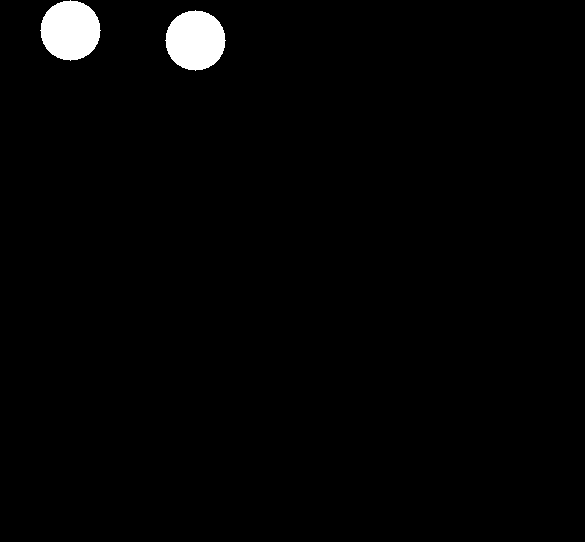


------------------------------------------------------

1. NOT (Komplemen Citra Asli)


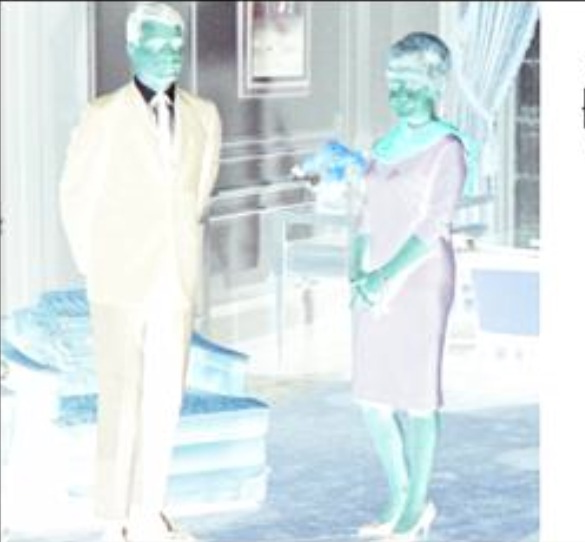


2. OR


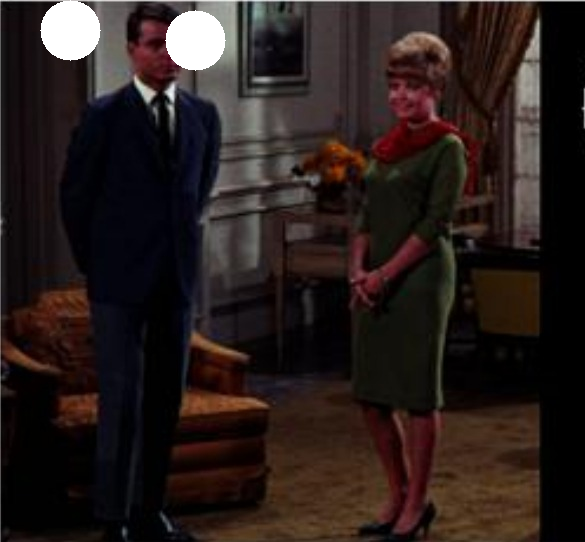


3. AND (Image Masking)


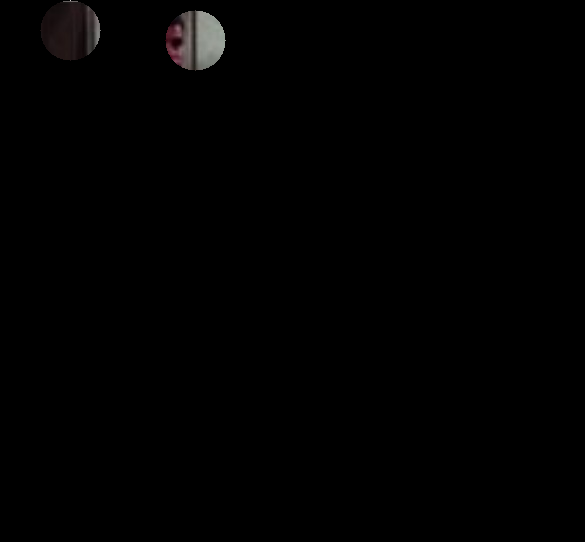


4. NAND


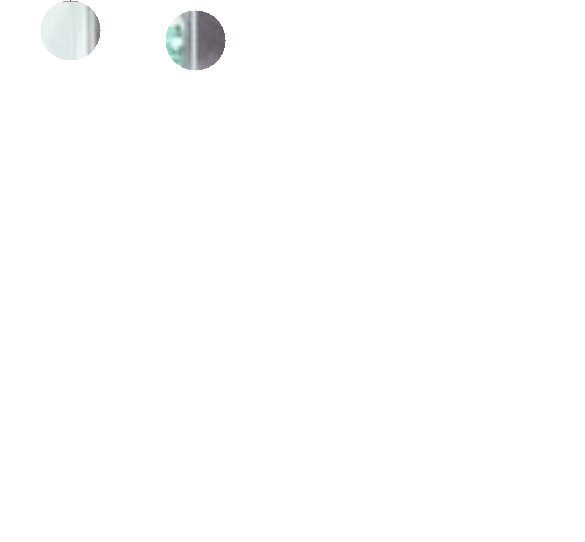


5. XOR


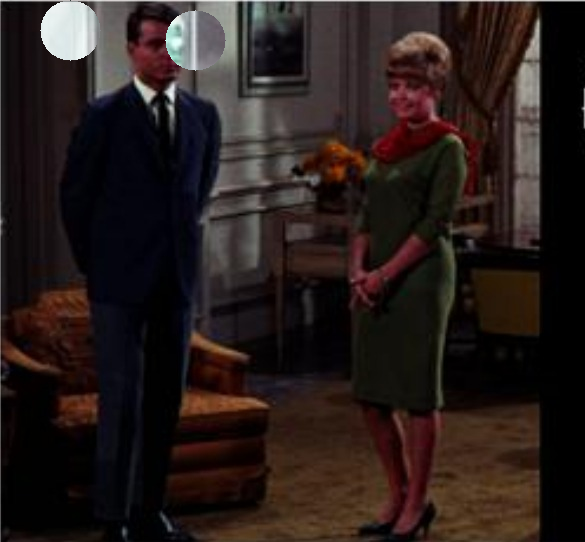

In [53]:

import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_couple = cv.imread('/content/drive/MyDrive/PCVK/WhatsApp Image 2026-09-10 at 12.54.50 AM.jpeg')

# Membuat kanvas hitam dengan ukuran yang sama dengan gambar asli
mask = np.zeros_like(img_couple)

# Menggambar dua lingkaran putih (Dinaikkan ke area wajah)
# Format: cv.circle(image, (sumbu_x, sumbu_y), radius, warna, ketebalan)
cv.circle(mask, (70, 30), 30, (255, 255, 255), -1)  # Mask wajah pria (kiri, dinaikkan)
cv.circle(mask, (195, 40), 30, (255, 255, 255), -1) # Mask wajah wanita (kanan, dinaikkan)

print("--- Masking yang digunakan (Untuk Kolom Image Input) ---")
cv2_imshow(mask)
print("\n------------------------------------------------------\n")

print("1. NOT (Komplemen Citra Asli)")
cv2_imshow(cv.bitwise_not(img_couple))

print("\n2. OR")
cv2_imshow(cv.bitwise_or(img_couple, mask))

print("\n3. AND (Image Masking)")
cv2_imshow(cv.bitwise_and(img_couple, mask))

print("\n4. NAND")
cv2_imshow(cv.bitwise_not(cv.bitwise_and(img_couple, mask)))

print("\n5. XOR")
cv2_imshow(cv.bitwise_xor(img_couple, mask))